In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler,Normalizer
from sklearn.pipeline import make_pipeline

In [3]:
df = pd.read_csv('chennai_house_multivariate_train.csv')

Now we will do some Exploratory Data Analysis.

In [4]:
df.shape

(5999, 17)

In [5]:
df.head()

,AreaCode,INT_SQFT,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,OTHER_ROOMS,PARK_FACILITY,BUILDINGTYPE,UTILITY_AVAIL,STREET,MZZONE,QS_ROOMS,QS_BATHROOM,QS_BEDROOM,REG_FEE,COMMIS,SALES_PRICE
0,4,1004,131,1,1,1,1,1,1,2,1,4.0,3.9,4.9,380000,144400,7600000
1,2,1986,26,2,1,2,0,1,1,1,4,4.9,4.2,2.5,760122,304049,21717770
2,1,909,70,1,1,1,1,1,2,1,5,4.1,3.8,2.2,421094,92114,13159200
3,7,1855,14,3,2,0,0,3,3,2,3,4.7,3.9,3.6,356321,77042,9630290
4,4,1226,84,1,1,1,1,3,1,1,2,3.0,2.5,4.1,237000,74063,7406250


In [6]:
df.describe()

,AreaCode,INT_SQFT,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,OTHER_ROOMS,PARK_FACILITY,BUILDINGTYPE,UTILITY_AVAIL,STREET,MZZONE,QS_ROOMS,QS_BATHROOM,QS_BEDROOM,REG_FEE,COMMIS,SALES_PRICE
count,5999.000000,5999.000000,5999.000000,5999.000000,5999.000000,5999.000000,5999.000000,5999.000000,5999.000000,5999.000000,5999.000000,5999.000000,5999.000000,5999.000000,5999.000000,5999.000000,5.999000e+03
mean,3.891982,1381.589765,99.500417,1.633939,1.214536,0.837473,0.507585,1.998666,2.249542,1.083514,4.307885,3.528455,3.503901,3.480430,377307.705951,140825.542924,1.089336e+07
std,1.821109,456.227575,57.513342,0.800564,0.410534,0.706344,0.499984,0.811922,0.851556,0.798377,1.504042,0.890389,0.896091,0.885469,142078.257698,78323.210519,3.749131e+06
min,1.000000,500.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,2.000000,2.000000,2.000000,71177.000000,5055.000000,2.156875e+06
25%,3.000000,993.000000,50.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,4.000000,2.800000,2.700000,2.700000,273609.000000,84137.500000,8.287400e+06
50%,4.000000,1374.000000,99.000000,1.000000,1.000000,1.000000,1.000000,2.000000,3.000000,1.000000,5.000000,3.500000,3.500000,3.500000,351406.000000,127751.000000,1.036659e+07
75%,5.000000,1744.000000,148.000000,2.000000,1.000000,1.000000,1.000000,3.000000,3.000000,2.000000,6.000000,4.300000,4.300000,4.200000,452059.000000,185005.500000,1.296593e+07
max,7.000000,2499.000000,200.000000,4.000000,2.000000,2.000000,1.000000,3.000000,3.000000,2.000000,6.000000,5.000000,5.000000,5.000000,983922.000000,495405.000000,2.366734e+07


In [7]:
df.groupby(['N_BEDROOM'])['REG_FEE','COMMIS','SALES_PRICE'].agg([np.sum,np.mean,np.std])

<ipython-input-7-1668d3d8b0d9>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df.groupby(['N_BEDROOM'])['REG_FEE','COMMIS','SALES_PRICE'].agg([np.sum,np.mean,np.std])


REG_FEE                                   COMMIS                 \
                  sum           mean            std        sum           mean   
N_BEDROOM                                                                       
1          1046085081  325680.286737  120847.513874  363463293  113157.936800   
2           818807809  413330.544674  131603.233914  315773995  159401.309944   
3           278081810  466580.218121  137412.152925  114515140  192139.496644   
4           120494228  573782.038095  149444.010075   51060004  243142.876190   

                         SALES_PRICE                              
                    std          sum          mean           std  
N_BEDROOM                                                         
1          65254.554826  31568979265  9.828449e+06  3.585204e+06  
2          72260.430500  23376503940  1.180036e+07  3.720986e+06  
3          80245.416024   7400906900  1.241763e+07  2.850217e+06  
4          98837.749419   3002895580  1.429950e+07  2.846257e+06

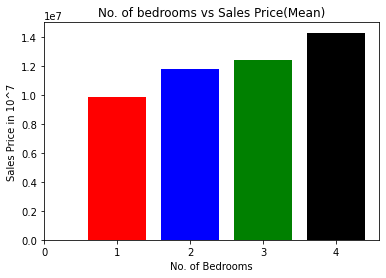

In [8]:
no_of_rooms = df['N_BEDROOM'].unique()
color = ['r','b','g','black']
y_val=[]
plt.figure()
for i in range(1,5):
    y_plot = df.loc[df['N_BEDROOM'] == i,'SALES_PRICE']
    y_val.append(y_plot.mean())
    
plt.bar(no_of_rooms,y_val,color=color)
plt.xticks(np.arange(0,5))
plt.xlabel('No. of Bedrooms')
plt.ylabel('Sales Price in 10^7')
plt.title('No. of bedrooms vs Sales Price(Mean)')
plt.show()

In [9]:
df.groupby(['N_BEDROOM','N_BATHROOM'])['REG_FEE','COMMIS','SALES_PRICE'].agg([np.sum,np.mean,np.std])

<ipython-input-9-3a28ba5c78bc>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df.groupby(['N_BEDROOM','N_BATHROOM'])['REG_FEE','COMMIS','SALES_PRICE'].agg([np.sum,np.mean,np.std])


REG_FEE                                   COMMIS  \
                             sum           mean            std        sum   
N_BEDROOM N_BATHROOM                                                        
1         1           1046085081  325680.286737  120847.513874  363463293   
2         1            644595150  429730.100000  136459.718180  250124014   
          2            174212659  362188.480249   99138.944595   65649981   
3         2            278081810  466580.218121  137412.152925  114515140   
4         2            120494228  573782.038095  149444.010075   51060004   

                                                   SALES_PRICE                \
                               mean           std          sum          mean   
N_BEDROOM N_BATHROOM                                                           
1         1           113157.936800  65254.554826  31568979265  9.828449e+06   
2         1           166749.342667  73953.275913  18825709890  1.255047e+07   
          2           136486.446985  61355.991181   4550794050  9.461110e+06   
3         2           192139.496644  80245.416024   7400906900  1.241763e+07   
4         2           243142.876190  98837.749419   3002895580  1.429950e+07   

                                    
                               std  
N_BEDROOM N_BATHROOM                
1         1           3.585204e+06  
2         1           3.759616e+06  
          2           2.393800e+06  
3         2           2.850217e+06  
4         2           2.846257e+06

In [10]:
df.groupby(['N_BEDROOM','N_BATHROOM'])['REG_FEE','COMMIS','SALES_PRICE'].agg([np.sum])

<ipython-input-10-10c3bfb742a4>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df.groupby(['N_BEDROOM','N_BATHROOM'])['REG_FEE','COMMIS','SALES_PRICE'].agg([np.sum])


REG_FEE     COMMIS  SALES_PRICE
                             sum        sum          sum
N_BEDROOM N_BATHROOM                                    
1         1           1046085081  363463293  31568979265
2         1            644595150  250124014  18825709890
          2            174212659   65649981   4550794050
3         2            278081810  114515140   7400906900
4         2            120494228   51060004   3002895580

In [11]:
df.groupby(['N_BEDROOM','N_BATHROOM','OTHER_ROOMS'])['REG_FEE','COMMIS','SALES_PRICE'].count()

<ipython-input-11-81f15e4ed579>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df.groupby(['N_BEDROOM','N_BATHROOM','OTHER_ROOMS'])['REG_FEE','COMMIS','SALES_PRICE'].count()


REG_FEE  COMMIS  SALES_PRICE
N_BEDROOM N_BATHROOM OTHER_ROOMS                              
1         1          0                776     776          776
                     1               1790    1790         1790
                     2                646     646          646
2         1          1               1058    1058         1058
                     2                442     442          442
          2          0                481     481          481
3         2          0                596     596          596
4         2          0                210     210          210

In [12]:
df.groupby(['BUILDINGTYPE','N_BEDROOM','PARK_FACILITY'])['REG_FEE','COMMIS','SALES_PRICE'].count()

<ipython-input-12-c4abe3254d02>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df.groupby(['BUILDINGTYPE','N_BEDROOM','PARK_FACILITY'])['REG_FEE','COMMIS','SALES_PRICE'].count()


REG_FEE  COMMIS  SALES_PRICE
BUILDINGTYPE N_BEDROOM PARK_FACILITY                              
1            1         0                  521     521          521
                       1                  541     541          541
             2         0                  331     331          331
                       1                  339     339          339
             3         0                   82      82           82
                       1                  111     111          111
             4         0                   30      30           30
                       1                   26      26           26
2            1         0                  517     517          517
                       1                  563     563          563
             2         0                  346     346          346
                       1                  340     340          340
             3         0                  103     103          103
                       1                   99      99           99
             4         0                   48      48           48
                       1                   29      29           29
3            1         0                  536     536          536
                       1                  534     534          534
             2         0                  303     303          303
                       1                  322     322          322
             3         0                  101     101          101
                       1                  100     100          100
             4         0                   36      36           36
                       1                   41      41           41

In [13]:
df.groupby(['AreaCode','BUILDINGTYPE','N_BEDROOM','PARK_FACILITY'])['REG_FEE','COMMIS','SALES_PRICE'].count()

<ipython-input-13-5ac5247f860e>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df.groupby(['AreaCode','BUILDINGTYPE','N_BEDROOM','PARK_FACILITY'])['REG_FEE','COMMIS','SALES_PRICE'].count()


REG_FEE  COMMIS  SALES_PRICE
AreaCode BUILDINGTYPE N_BEDROOM PARK_FACILITY                              
1        1            1         0                   92      92           92
                                1                   86      86           86
                      2         0                   20      20           20
                                1                   16      16           16
         2            1         0                   77      77           77
...                                                ...     ...          ...
7        2            3         1                   50      50           50
         3            2         0                   75      75           75
                                1                   97      97           97
                      3         0                   51      51           51
                                1                   50      50           50

[96 rows x 3 columns]

In [14]:
df.groupby(['AreaCode','BUILDINGTYPE','N_BEDROOM','PARK_FACILITY'])['REG_FEE','COMMIS','SALES_PRICE'].sum()

<ipython-input-14-86eae0ea094e>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df.groupby(['AreaCode','BUILDINGTYPE','N_BEDROOM','PARK_FACILITY'])['REG_FEE','COMMIS','SALES_PRICE'].sum()


REG_FEE    COMMIS  SALES_PRICE
AreaCode BUILDINGTYPE N_BEDROOM PARK_FACILITY                                 
1        1            1         0              34222209   8002533    972204510
                                1              34749196   7980312    986536400
                      2         0               9603690   2529088    274173265
                                1               8152939   1960401    236656580
         2            1         0              18587943   4050866    528025080
...                                                 ...       ...          ...
7        2            3         1              17997805   7331655    514636440
         3            2         0              23125116   9132387    660784160
                                1              34081836  13074568    970505690
                      3         0              18031085   7259661    514541330
                                1              18059332   7635619    525155150

[96 rows x 3 columns]

In [15]:
df.isna().sum()

AreaCode         0
INT_SQFT         0
DIST_MAINROAD    0
N_BEDROOM        0
N_BATHROOM       0
OTHER_ROOMS      0
PARK_FACILITY    0
BUILDINGTYPE     0
UTILITY_AVAIL    0
STREET           0
MZZONE           0
QS_ROOMS         0
QS_BATHROOM      0
QS_BEDROOM       0
REG_FEE          0
COMMIS           0
SALES_PRICE      0
dtype: int64

For park facility 0 is no and 1 is yes. And Area Code is also a categorical value ranging from 1 to 7.

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5999 entries, 0 to 5998
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   AreaCode       5999 non-null   int64  
 1   INT_SQFT       5999 non-null   int64  
 2   DIST_MAINROAD  5999 non-null   int64  
 3   N_BEDROOM      5999 non-null   int64  
 4   N_BATHROOM     5999 non-null   int64  
 5   OTHER_ROOMS    5999 non-null   int64  
 6   PARK_FACILITY  5999 non-null   int64  
 7   BUILDINGTYPE   5999 non-null   int64  
 8   UTILITY_AVAIL  5999 non-null   int64  
 9   STREET         5999 non-null   int64  
 10  MZZONE         5999 non-null   int64  
 11  QS_ROOMS       5999 non-null   float64
 12  QS_BATHROOM    5999 non-null   float64
 13  QS_BEDROOM     5999 non-null   float64
 14  REG_FEE        5999 non-null   int64  
 15  COMMIS         5999 non-null   int64  
 16  SALES_PRICE    5999 non-null   int64  
dtypes: float64(3), int64(14)
memory usage: 796.9 KB


In [17]:
df['PARK_FACILITY'] = df['PARK_FACILITY'].astype('category')
df['AreaCode'] = df['AreaCode'].astype('category')

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5999 entries, 0 to 5998
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   AreaCode       5999 non-null   category
 1   INT_SQFT       5999 non-null   int64   
 2   DIST_MAINROAD  5999 non-null   int64   
 3   N_BEDROOM      5999 non-null   int64   
 4   N_BATHROOM     5999 non-null   int64   
 5   OTHER_ROOMS    5999 non-null   int64   
 6   PARK_FACILITY  5999 non-null   category
 7   BUILDINGTYPE   5999 non-null   int64   
 8   UTILITY_AVAIL  5999 non-null   int64   
 9   STREET         5999 non-null   int64   
 10  MZZONE         5999 non-null   int64   
 11  QS_ROOMS       5999 non-null   float64 
 12  QS_BATHROOM    5999 non-null   float64 
 13  QS_BEDROOM     5999 non-null   float64 
 14  REG_FEE        5999 non-null   int64   
 15  COMMIS         5999 non-null   int64   
 16  SALES_PRICE    5999 non-null   int64   
dtypes: category(2), float64(3), int64

Now lets do some visualization.

In [19]:
cmap = cm.get_cmap('gnuplot')
scatter_plot = pd.plotting.scatter_matrix(df,c='b',marker = 'o', s=40, figsize=(200,200), cmap=cmap)

So from this we can see that our data is mostly linearly correlated to each other.

In [20]:
X = df[['AreaCode','INT_SQFT','DIST_MAINROAD','N_BEDROOM','N_BATHROOM','OTHER_ROOMS','PARK_FACILITY','BUILDINGTYPE','UTILITY_AVAIL','STREET','MZZONE','QS_ROOMS','QS_BATHROOM','QS_BEDROOM','REG_FEE','COMMIS']]
y = df['SALES_PRICE']

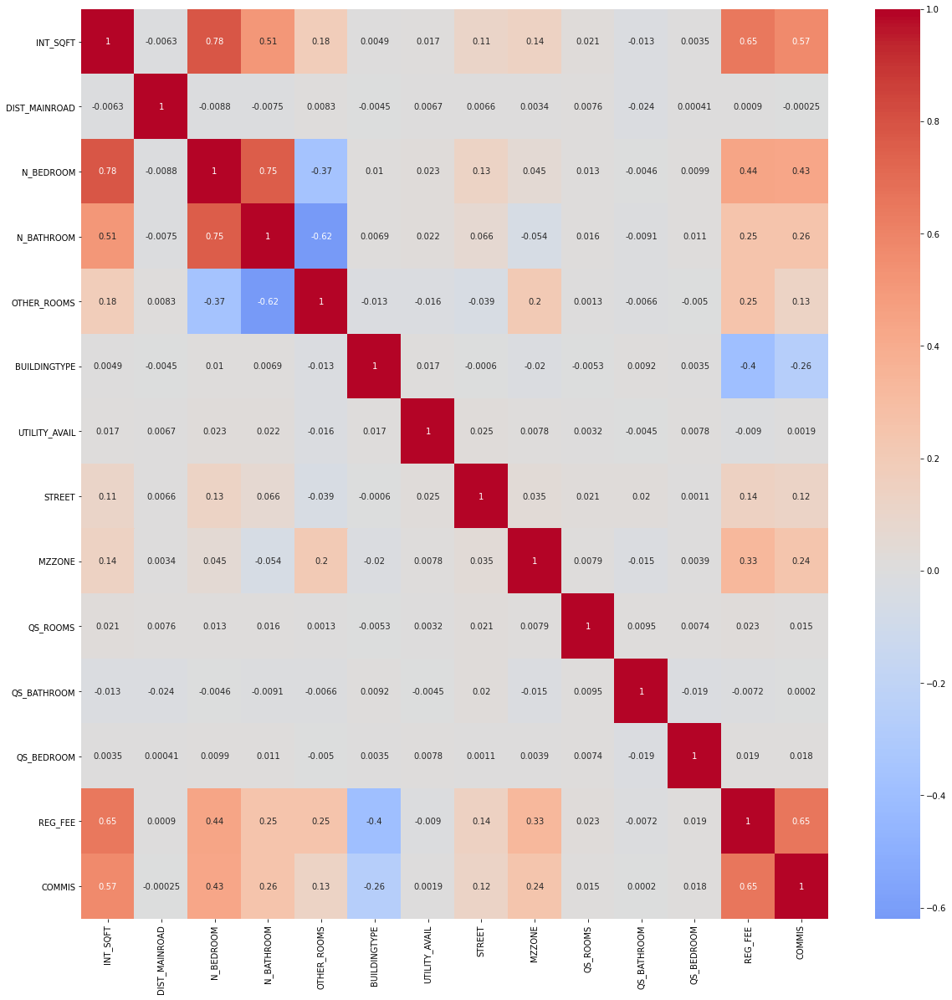

In [21]:
plt.figure(1,figsize=(20,20))
sns.heatmap(X.corr(),cmap='coolwarm',annot=True,center=0)
plt.show()

In [22]:
X.shape

(5999, 16)

In [23]:
y.shape

(5999,)

In [24]:
y = np.asarray(y)
y = y.reshape(-1,1)
y = pd.DataFrame(y,columns=['SALES_PRICE'])
y.shape

(5999, 1)

Splitting the data to get train and test set.

In [25]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=42)

Fitting the data to Multiple Linear Regression model and standardizing the data before fitting it to the model. 

In [26]:
stdscaler = StandardScaler()
multireg = LinearRegression()

In [27]:
pipeline = make_pipeline(stdscaler,multireg)

In [28]:
pipeline.fit(X_train,y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('linearregression', LinearRegression())])

In [29]:
y_pred = pipeline.predict(X_test)
print(y_pred)

[[ 9921034.65466576]
 [ 9867898.28627626]
 [ 5684075.23261727]
 ...
 [10805981.74468123]
 [ 6963479.20810361]
 [10734350.08859831]]


In [30]:
print('The accuracy using multiple Linear Regression is: {} %'.format(100*pipeline.score(X_test,y_test)))

The accuracy using multiple Linear Regression is: 87.7477658719803 %


In [31]:
print(multireg.coef_)

[[-344776.88389471  379847.92653867   21216.68239695  416603.47122773
   192800.82504907 1143861.18479505  240997.16324276 -814668.80546152
   -53312.42678183   40323.67105983  587394.25175447   34695.58712423
    12316.0304723    21126.46823113 1893742.84175829  198350.63874764]]


In [32]:
print(multireg.intercept_)

[10892477.67801858]


Results form Cross Validation where k=5 .

In [33]:
X_std = stdscaler.fit_transform(X)
y_std = stdscaler.fit_transform(y)
multireg_cv = LinearRegression()

In [34]:
cv_scores = cross_val_score(multireg_cv,X_std,y_std,cv=5)

In [35]:
print(cv_scores)

[0.87373058 0.87529358 0.88584089 0.85472901 0.87681616]


In [36]:
x_splits = ['split0','split1','split2','split3','split4']

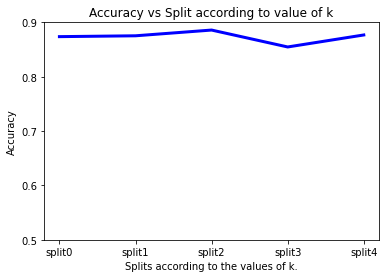

In [37]:
plt.plot(x_splits,cv_scores,c='b',linewidth=3)
plt.title('Accuracy vs Split according to value of k')
plt.yticks(np.arange(0.5,1,0.1))
plt.xlabel('Splits according to the values of k.')
plt.ylabel('Accuracy')
plt.show()